# Load libraries

In [1]:
from glob import glob # to find files in the directory

In [2]:
import earthpy as et
import earthpy.spatial as es # normalized_diff
import earthpy.plot as ep # to plot certain band combos
import earthpy.mask as em # to apply a mask

In [3]:
import rasterio as rio # to open the satellite bands

In [4]:
import matplotlib.pyplot as plt # to plot the images
from matplotlib.colors import ListedColormap

In [5]:
import numpy as np # to stack and divide satellite images

# Read Data

In [6]:
np.seterr(divide='ignore', invalid='ignore')
S_sentinel_bands = glob("./NGaza/*B?*.tiff") #used to find all the files in the given directory with names matching the specified pattern
S_sentinel_bands.sort()

In [7]:
S_sentinel_bands

['./NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B01_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B02_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B03_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B04_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B05_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B06_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B07_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B08A_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B08_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B09_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B11_(Raw).tiff',
 './NGaza/2023-11-11-00:00_2023-11-11-23:59_Sentinel-2_L2A_B12_(Raw).tiff']

# Bands & Exploration

CRS is EPSG:3857

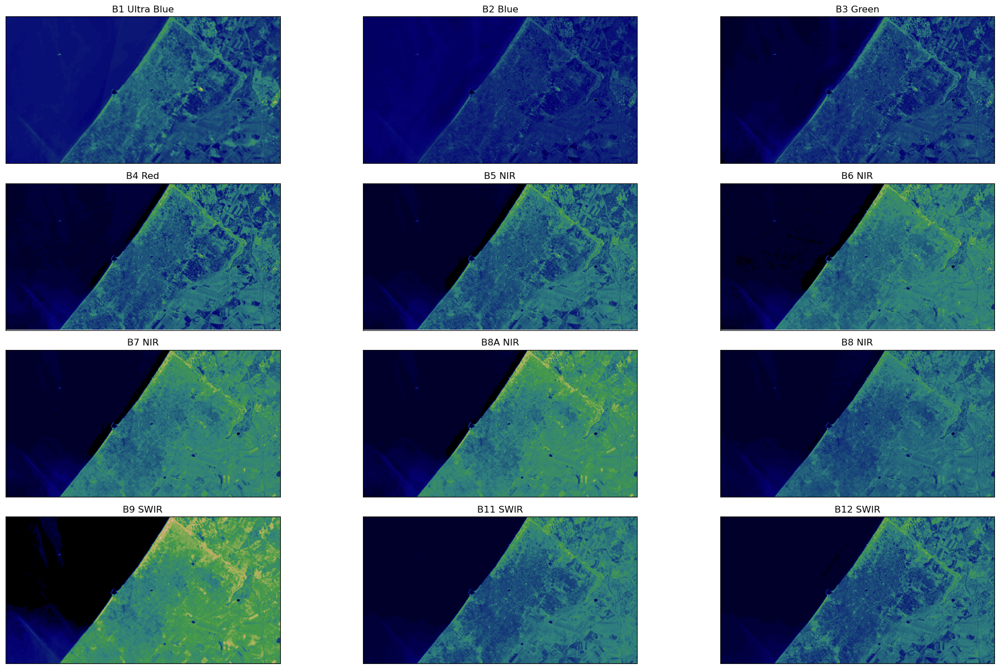

In [8]:
l = []
for i in S_sentinel_bands:
    with rio.open(i, 'r') as f: #'r' indicates that the file should be opened in read mode
        l.append(f.read(1))
arr_st = np.stack(l) 
#After the bands are read and appended to the list, they are stacked together using NumPy's stack function
#This results in a 3D array where the first two dimensions correspond to the pixel coordinates and the third dimension is the stacked band number
titles = ["B1 Ultra Blue", "B2 Blue", "B3 Green", "B4 Red", "B5 NIR", "B6 NIR", "B7 NIR", "B8A NIR","B8 NIR", "B9 SWIR", "B11 SWIR" , "B12 SWIR"]
ep.plot_bands(arr_st, cmap = 'gist_earth', figsize = (20, 12), cols = 3, cbar = False,title=titles) #EarthPy's plot_bands
#each band's pixel values mapped to a unique color using the 'gist_earth' colormap
plt.show()

## Histogram

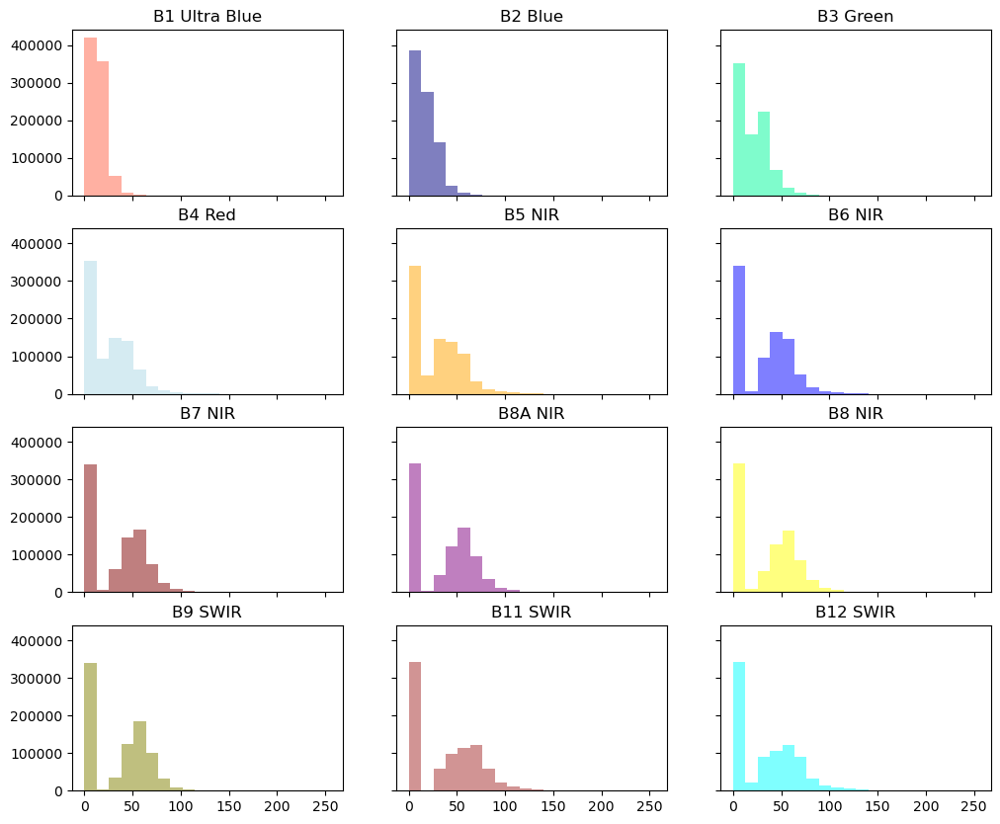

In [9]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']
ep.hist(arr_st, 
        colors = colors,
        title=[f'{i}' for i in titles], 
        cols=3, 
        alpha=0.5, 
        figsize = (12, 10)
        )
plt.show()

### Why does Sentinel-2 have two 8 bands

B8 is a pan-sharpened version of B4, which is a red visible light band. B8 is used for applications that require high spatial resolution, such as monitoring urban and agricultural areas, coastal zones, and land use.

B8a is a narrow spectral band in the near-infrared range, located between B8 and B9. B8a is particularly useful for vegetation monitoring, as it corresponds to the wavelength range of healthy vegetation that reflects strongly in the near-infrared.

The two 8 bands in Sentinel-2 enable more accurate and detailed analysis of features on the Earth's surface. By using both bands, it is possible to capture both the spatial details of a scene and the spectral characteristics of vegetation and other targets. This dual-band approach can improve the ability of Sentinel-2 to detect changes in vegetation health, land use, and other factors that affect the Earth's surface.

# Visualize different band combinations

## RGB Image (B4, B3, B2)

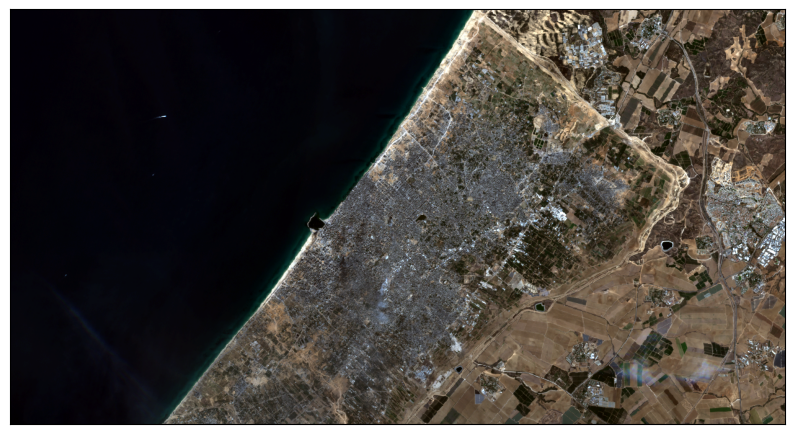

In [10]:
# RGB Composite Image with Strech

ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1), #Natural Color (B4, B3, B2)
    stretch=True,
    str_clip=0.2,
    figsize=(10, 16),
)

plt.show()

## Infrared Image (B8, B4, B3)

This combo is used to emphasize healthy and unhealthy vegetation. The NIR (B8) band is especially good at reflecting chlorophyll. Dense vegetation is red while urban areas are white.



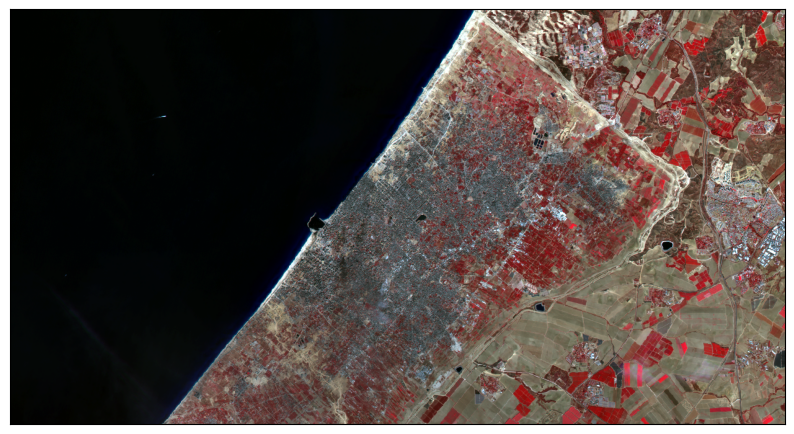

In [11]:
rgb = ep.plot_rgb(arr_st, 
                  rgb=(8,3,2), #Color Infrared (B8, B4, B3)
                  str_clip=0.2,
                  stretch=True,
                  figsize=(10, 16))
plt.show()


## False Color Urban RGB Composite (B12, B11, B4)

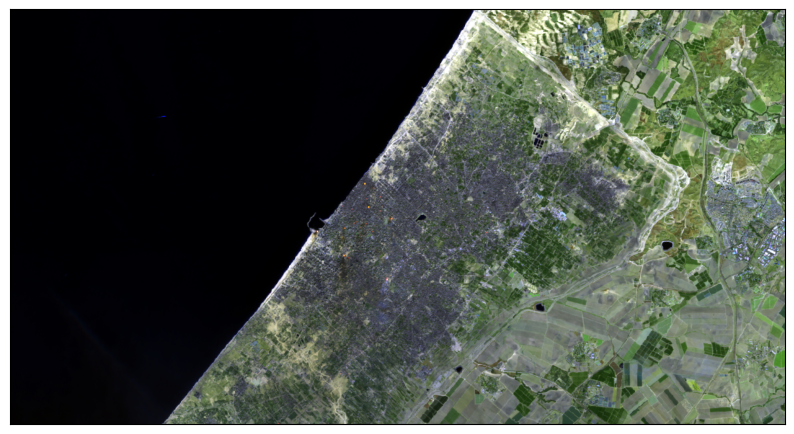

In [12]:
rgb = ep.plot_rgb(arr_st, 
                  rgb=(11,10,3), #Color Infrared (B12, B11, B4)
                  str_clip=0.2,
                  stretch=True,
                  figsize=(10, 16))
plt.show()

## Short-Wave Infrared (B12, B8A, B4)

This combo shows vegetation in various shades of green. Darker shades of green indicate denser vegetation while brown indicates bare soil / built-up areas

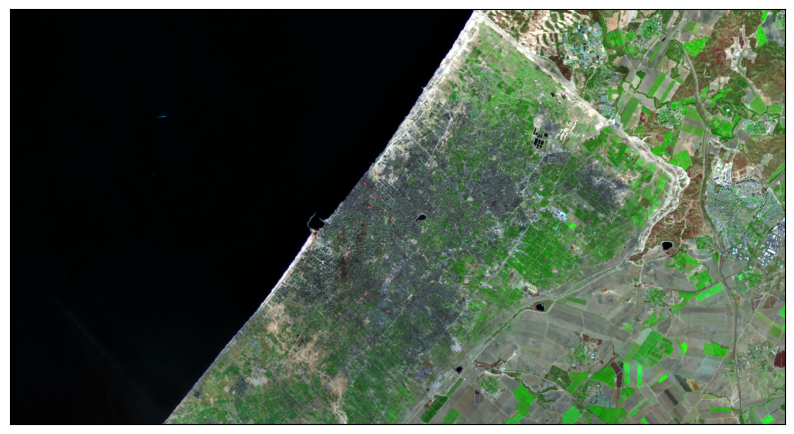

In [13]:
rgb = ep.plot_rgb(arr_st, 
                  rgb=(11,7,3), 
                  str_clip=0.2,
                  stretch=True,
                  figsize=(10, 16))
plt.show()

## Agriculture (B11, B8, B2)

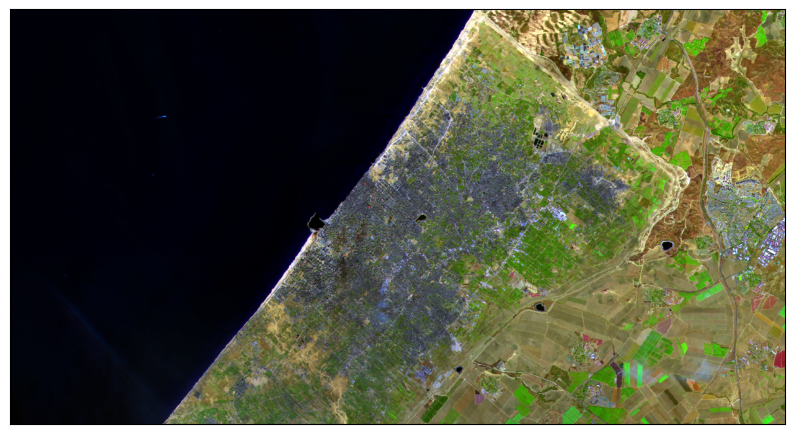

In [14]:
rgb = ep.plot_rgb(arr_st, 
                  rgb=(10,8,1),
                  str_clip=0.2,
                  stretch=True,
                  figsize=(10, 16))
plt.show()

## Geology (B12, B11, B2)


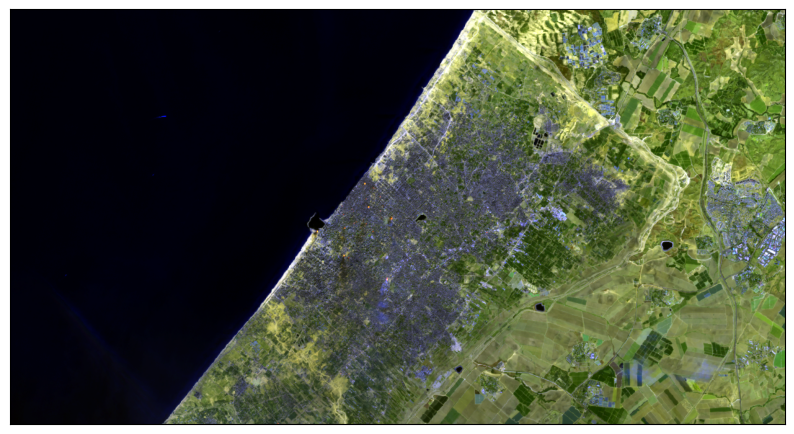

In [15]:
rgb = ep.plot_rgb(arr_st, 
                  rgb=(11,10,1),
                  str_clip=0.2,
                  stretch=True,
                  figsize=(10, 16))
plt.show()

## Bathymetric (B4, B3, B1)

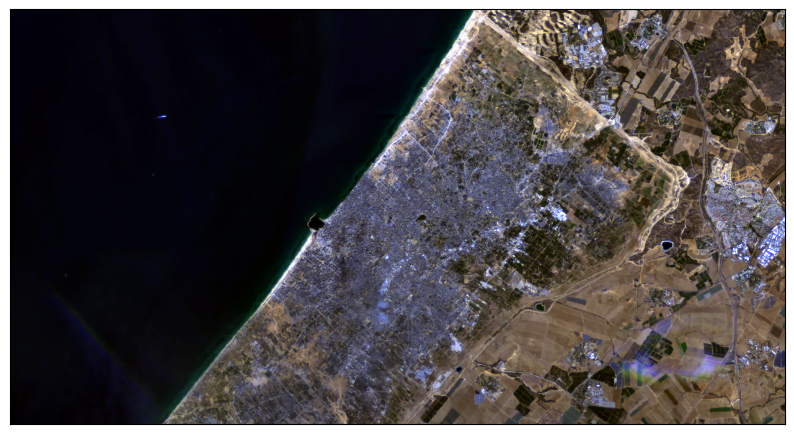

In [16]:
rgb = ep.plot_rgb(arr_st, 
                  rgb=(3,2,0),
                  str_clip=0.2,
                  stretch=True,
                  figsize=(10, 16))
plt.show()

# Band combinations for vegetation and soil indices

## Normalized Difference Vegetation Index, NDVI (B8, B4)

To determine the density of green on a patch of land, researchers must observe the distinct colors (wavelengths) of visible(VIS) and near-infrared (NIR)sunlight reflected by the plants. The Normalized Difference Vegetation Index (NDVI) quantifies vegetation by measuring the difference between near-infrared which vegetation strongly reflects and red light (which vegetation absorbs). NDVI always ranges from -1 to +1.

p.s. There seems to be more contrast when I use B8A (stack 11) instead of B8 (stack 7) so I will use B8A

/Users/jhjanicki/anaconda3/lib/python3.10/site-packages/earthpy/spatial.py:109: Warning: Divide by zero produced infinity values that will be replaced with nan values
  warnings.warn(


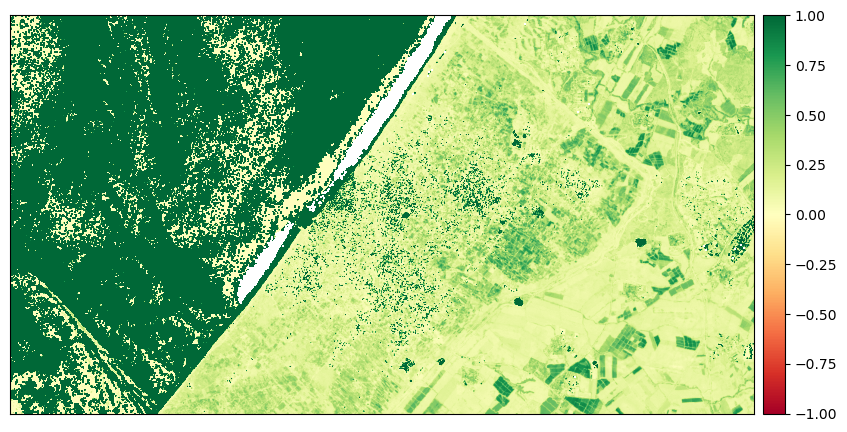

In [17]:
ndvi = es.normalized_diff(arr_st[7], arr_st[3])  #B8 and B4 (VNIR & R)...can also use B8A (last position in stack)

ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Soil Adjusted Vegetation Index (SAVI)

The Soil-Adjusted Vegetation Index (SAVI) is a vegetation index that attempts to minimize soil brightness influences using a soil-brightness correction factor. This is often used in arid regions where vegetative cover is low.

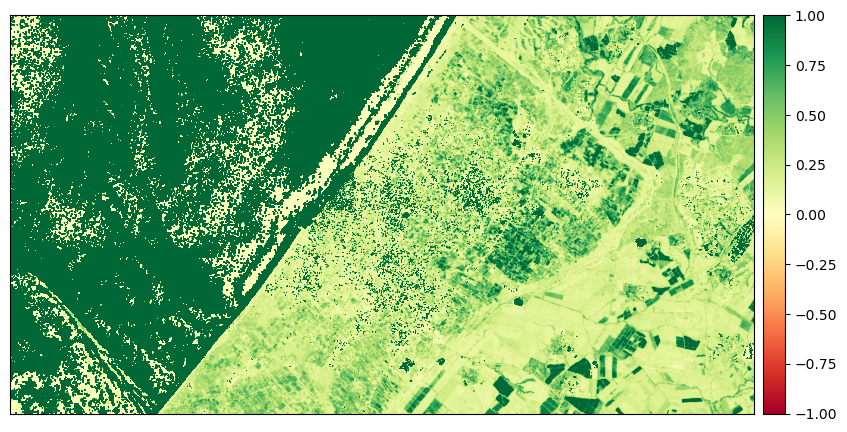

In [18]:
L = 0.5

savi = ((arr_st[7] - arr_st[3]) / (arr_st[7] + arr_st[3] + L)) * (1 + L) # either use 7 or 8
 
ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Band combinations for water indices

Surface water change is a very important indicator of environmental, climatic, and anthropogenic activities. Remote sensors, such as sentinel-2, Landsat, have been providing data for the last four decades, which are useful for extracting land cover types such as forest and water. Researchers have proposed many surface water extraction techniques, among which index-based methods are popular owing to their simplicity and cost-effectiveness.

## Modified Normalized Difference Water Index (MNDWI)

The Modified Normalized Difference Water Index (MNDWI) uses green and SWIR bands for the enhancement of open water features. It also diminishes built-up area features that are often correlated with open water in other indices.

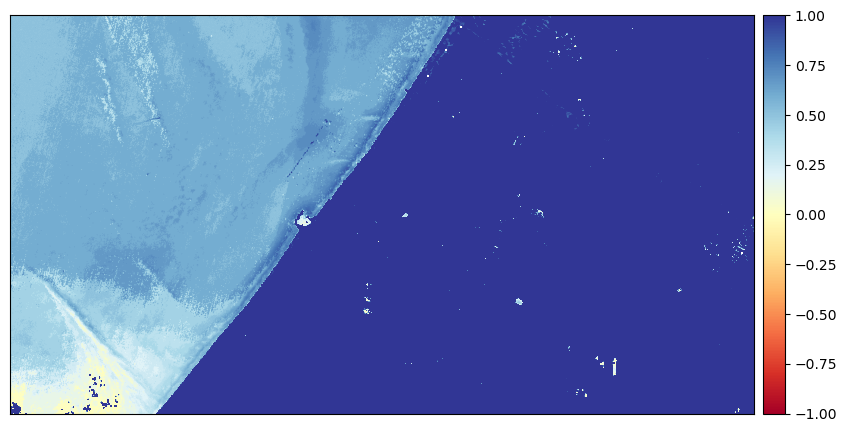

In [19]:
mndwi = es.normalized_diff(arr_st[2], arr_st[11])

ep.plot_bands(mndwi, cmap="RdYlBu", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Normalized Difference Moisture Index (NDMI)

The Normalized Difference Moisture Index (NDMI) is sensitive to the moisture levels in vegetation. It is used to monitor droughts as well as monitor fuel levels in fire-prone areas. It uses NIR and SWIR bands to create a ratio designed to mitigate illumination and atmospheric effects.

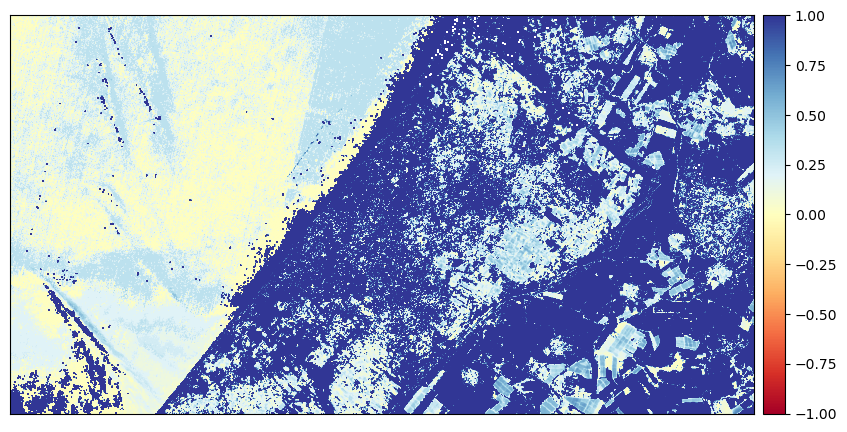

In [20]:
ndmi = es.normalized_diff(arr_st[8], arr_st[11])

ep.plot_bands(ndmi, cmap="RdYlBu", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Band combination for geology indices

Satellite imagery and aerial photography have proven to be important tools in support of mineral exploration projects. They can be used in a variety of ways. Firstly they provide geologists and field crews the location of tracks, roads, fences, and inhabited areas.

## Clay Minerals

The clay ratio is a ratio of the SWIR1 and SWIR2 bands. This ratio leverages the fact that hydrous minerals such as clays, alunite absorb radiation in the 2.0–2.3 micron portion of the spectrum. This index mitigates illumination changes due to terrain since it is a ratio.

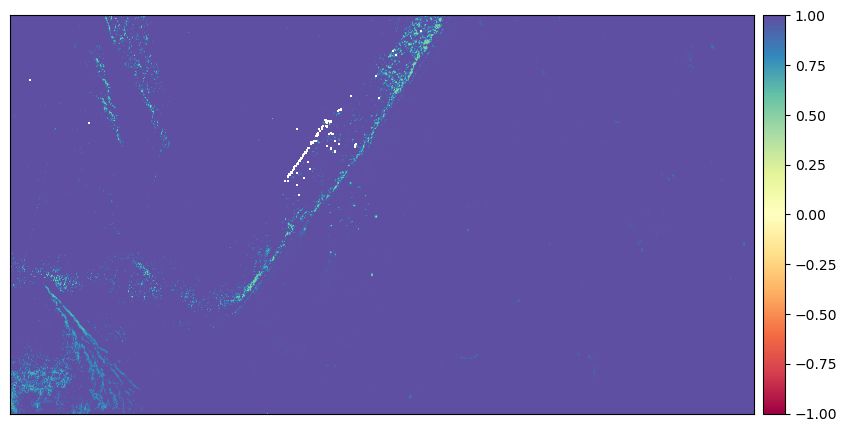

In [21]:
cmr = np.divide(arr_st[10], arr_st[11])

ep.plot_bands(cmr, cmap="Spectral", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Ferrous Minerals

The ferrous minerals ratio highlights iron-bearing materials. It uses the ratio between the SWIR band and the NIR band.

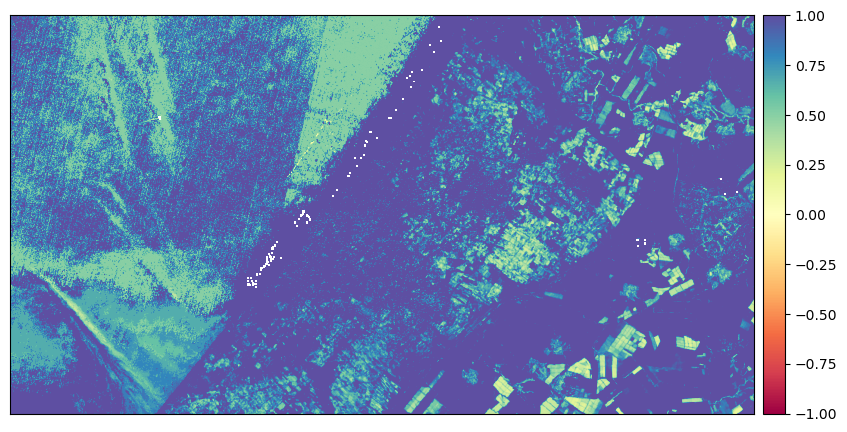

In [22]:
fmr = np.divide(arr_st[11], arr_st[8])

ep.plot_bands(fmr, cmap="Spectral", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Create and apply water mask

## Land and water masks

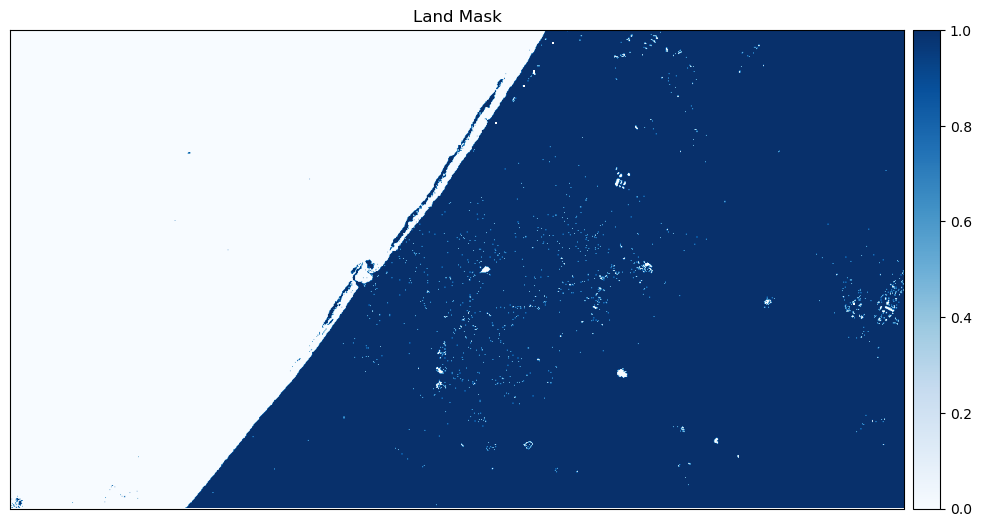

<Axes: title={'center': 'Land Mask'}>

In [23]:
ndwi = es.normalized_diff(arr_st[2], arr_st[10])
land_mask = ndwi > 0.8
water_mask = ~land_mask
ep.plot_bands(land_mask, cmap="Blues", title="Land Mask")

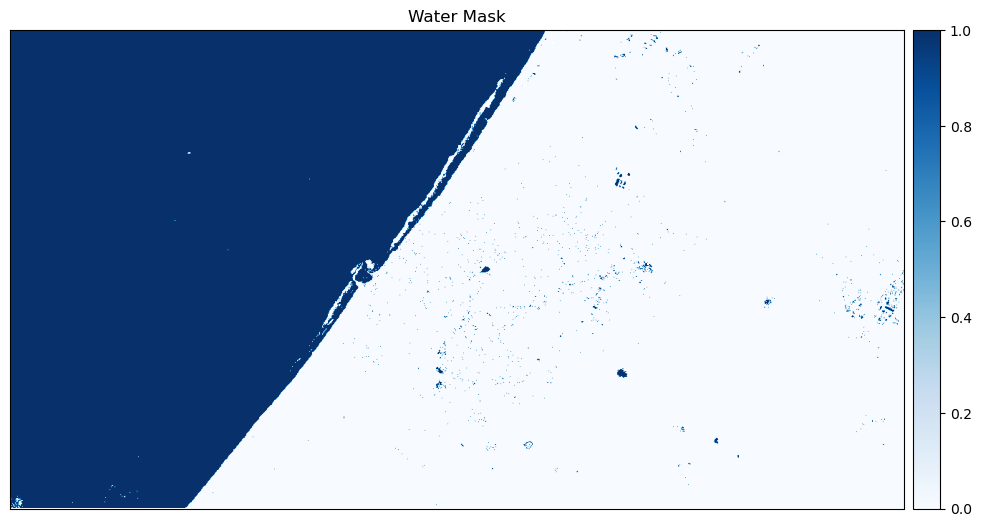

<Axes: title={'center': 'Water Mask'}>

In [24]:
ep.plot_bands(water_mask, cmap="Blues", title="Water Mask")

## Apply water mask to RGB image

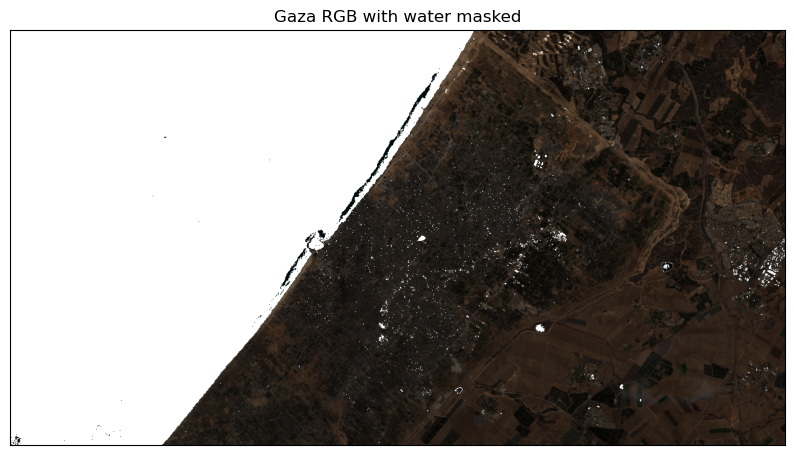

In [25]:
arr_ma_water = em.mask_pixels(arr_st, water_mask)

ep.plot_rgb(
    arr_ma_water,
    rgb=(3, 2, 1), 
    str_clip=0.2, 
    title="Gaza RGB with water masked"
)
plt.show()
